## Week 4B:  Working with Raster Data

Sep 29, 2021

## Housekeeping

- [Homework #2](https://github.com/MUSA-550-Fall-2021/assignment-2) due today
- [Homework #3](https://github.com/MUSA-550-Fall-2021/assignment-3) posted today, due in two weeks (10/13)
    - Part 1: Working with eviction data in Philadelphia
    - Part 2: Exploring the NDVI in Philadelphia
- Come to office hours!
    - Tuesday evening (Nick) 6-8pm
    - Monday afternoon (Stella) 12:30 pm - 2 pm
    - Sign up for time slots on Canvas calendar

## Follow along in lecture on Binder!

All lecture slides will work on Binder, data is available to be loaded, etc. Binder has an exact copy of the file structure in the GitHub repo.

https://github.com/MUSA-550-Fall-2021/week-4

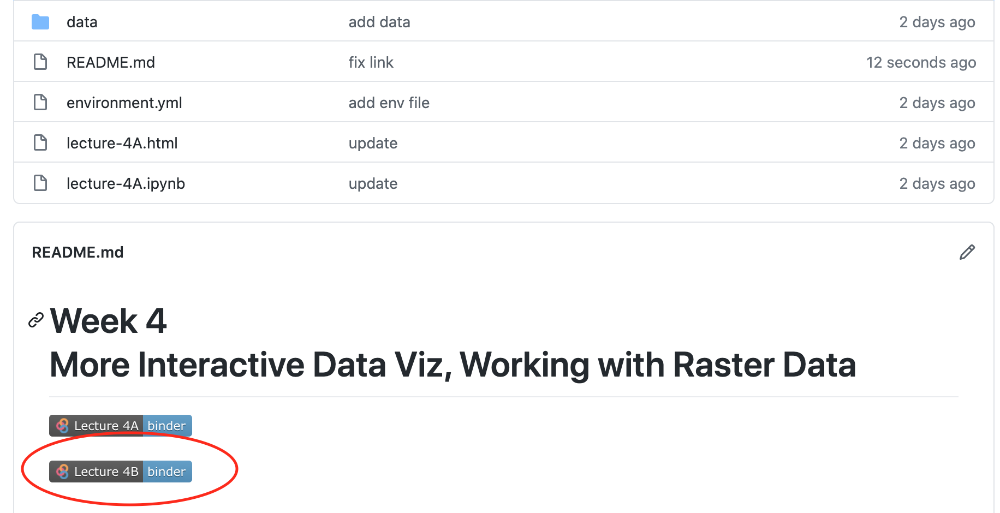

## Last time: A set of coordinated visualization libraries in Python

<center>
    <a href=https://holoviz.org/>
        <img src=attachment:Screen%20Shot%202019-09-19%20at%2012.43.29%20AM.png width=200></img>
    </a>
</center>
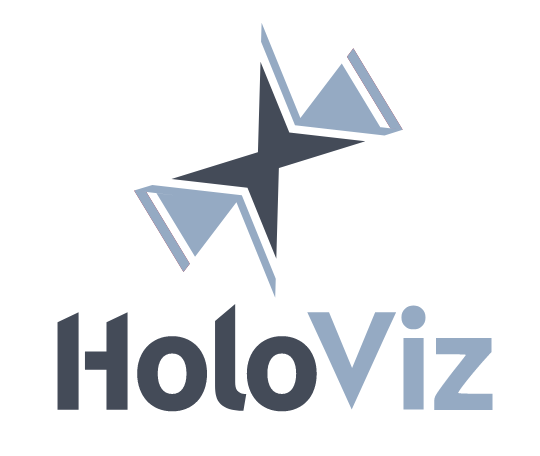

<center>
    <img src=attachment:Screen%20Shot%202019-09-19%20at%2012.46.03%20AM%201.png width=700></img>
</center>
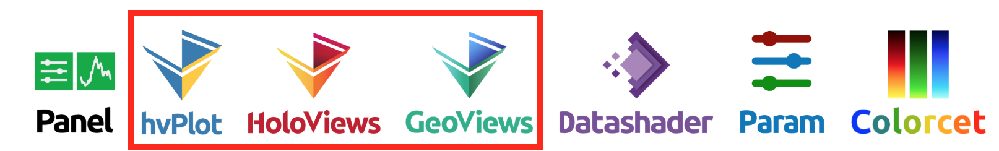

## hvplot

- Quickly generate interactive plots from your data
- Seamlessly handles pandas and geopandas data
- Relies on Holoviews and Geoviews under the hood
- Fancy, magic widgets for grouping charts by a third column
- Great built-in interaction toolbar powered by bokeh: box select, lasso, pan, zoom, etc...

An interface just like the `pandas` plot() function, but **much** more useful.

In [62]:
# Our usual imports
import pandas as pd
import geopandas as gpd
import numpy as np
from matplotlib import pyplot as plt

In [63]:
# This will add the .hvplot() function to your DataFrame!
import hvplot.pandas

# Import holoviews too
import holoviews as hv

## Last time: hvplot has great support for geopandas

Example: Interactive choropleth of median property assessments in Philadelphia

In [32]:
# Load the data
url = "https://raw.githubusercontent.com/MUSA-550-Fall-2021/week-3/main/data/opa_residential.csv"
data = pd.read_csv(url)

# Create the Point() objects
data['geometry'] = gpd.points_from_xy(data['lng'], data['lat'])

# Create the GeoDataFrame
data = gpd.GeoDataFrame(data, geometry='geometry', crs="EPSG:4326")


In [33]:
# load the Zillow data from GitHub
url = "https://raw.githubusercontent.com/MUSA-550-Fall-2021/week-3/main/data/zillow_neighborhoods.geojson"
zillow = gpd.read_file(url)
zillow.head()

,ZillowName,geometry
0,Academy Gardens,"POLYGON ((-74.99851 40.06435, -74.99456 40.061..."
1,Airport,"POLYGON ((-75.19728 39.89252, -75.19617 39.892..."
2,Allegheny West,"POLYGON ((-75.16592 40.00327, -75.16596 40.003..."
3,Andorra,"POLYGON ((-75.22463 40.06686, -75.22588 40.065..."
4,Aston Woodbridge,"POLYGON ((-75.00860 40.05369, -75.00861 40.053..."


In [34]:
# Important: Make sure the CRS match
data = data.to_crs(zillow.crs)

# perform the spatial join
data = gpd.sjoin(data, zillow, op='within', how='left')
data

,parcel_number,lat,lng,location,market_value,building_value,land_value,total_land_area,total_livable_area,geometry,index_right,ZillowName
0,71361800,39.991575,-75.128994,2726 A ST,62200.0,44473.0,17727.0,1109.69,1638.0,POINT (-75.12899 39.99158),79.0,McGuire
1,71362100,39.991702,-75.128978,2732 A ST,25200.0,18018.0,7182.0,1109.69,1638.0,POINT (-75.12898 39.99170),79.0,McGuire
2,71362200,39.991744,-75.128971,2734 A ST,62200.0,44473.0,17727.0,1109.69,1638.0,POINT (-75.12897 39.99174),79.0,McGuire
3,71362600,39.991994,-75.128895,2742 A ST,15500.0,11083.0,4417.0,1109.69,1638.0,POINT (-75.12889 39.99199),79.0,McGuire
4,71363800,39.992592,-75.128743,2814 A ST,31300.0,22400.0,8900.0,643.50,890.0,POINT (-75.12874 39.99259),79.0,McGuire
...,...,...,...,...,...,...,...,...,...,...,...,...
461455,662261100,40.080319,-74.991667,3538 DRUMORE DR,196500.0,137550.0,58950.0,1616.40,1449.0,POINT (-74.99167 40.08032),84.0,Modena
461456,353010800,40.046351,-75.095466,600 MC KINLEY ST,121000.0,96437.0,24563.0,2227.50,1152.0,POINT (-75.09547 40.04635),70.0,Lawndale
461457,888114766,39.950836,-75.165913,1500 CHESTNUT ST,256700.0,236164.0,20536.0,0.00,759.0,POINT (-75.16591 39.95084),117.0,Rittenhouse
461458,323300800,39.986612,-75.184586,1965 N NAPA ST,29100.0,21534.0,7566.0,672.00,840.0,POINT (-75.18459 39.98661),129.0,Strawberry Mansion


In [35]:
# Calculate the median market value per Zillow neighborhood
median_values = data.groupby("ZillowName", as_index=False)["market_value"].median()

# Merge median values with the Zillow geometries
median_values = zillow.merge(median_values, on="ZillowName")
print(type(median_values))

<class 'geopandas.geodataframe.GeoDataFrame'>


In [36]:
median_values.head()

,ZillowName,geometry,market_value
0,Academy Gardens,"POLYGON ((-74.99851 40.06435, -74.99456 40.061...",185950.0
1,Allegheny West,"POLYGON ((-75.16592 40.00327, -75.16596 40.003...",34750.0
2,Andorra,"POLYGON ((-75.22463 40.06686, -75.22588 40.065...",251900.0
3,Aston Woodbridge,"POLYGON ((-75.00860 40.05369, -75.00861 40.053...",183800.0
4,Bartram Village,"POLYGON ((-75.20733 39.93350, -75.20733 39.933...",48300.0


## Take advantage of GeoViews

Let's add a tile source underneath the choropleth map

In [37]:
import geoviews as gv
import geoviews.tile_sources as gvts

In [38]:
%%opts WMTS [width=800, height=800, xaxis=None, yaxis=None]

choro = median_values.hvplot(c='market_value', 
                             width=500, 
                             height=400, 
                             alpha=0.5, 
                             geo=True,
                             cmap='viridis', 
                             hover_cols=['ZillowName'])
gvts.ESRI * choro

:Overlay
   .WMTS.I     :WMTS   [Longitude,Latitude]
   .Polygons.I :Polygons   [Longitude,Latitude]   (market_value,ZillowName)

## hvplot also works with *raster* data

- So far we've been working mainly with *vector* data using geopandas: lines, points, polygons
- The basemaps we've been adding are an exampe of *raster* data
- **Raster data:**
    - Gridded or pixelated
    - Maps easily to an array — it's the representation for digital images

<img src=attachment:Screen%20Shot%202019-09-19%20at%201.52.13%20AM.png width=800></img>
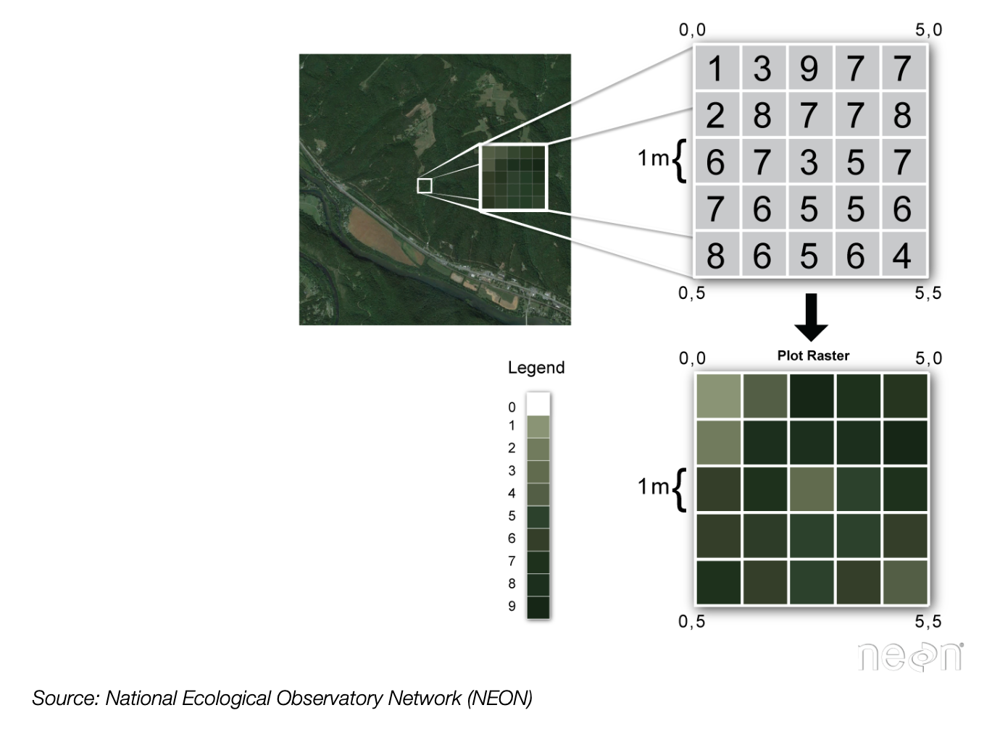

## Continuous raster examples

- Multispectral satellite imagery, e.g., the Landsat satellite
- Digital Elevation Models (DEMs)
- Maps of canopy height derived from LiDAR data.

## Categorical raster examples

- Land cover or land-use maps.
- Tree height maps classified as short, medium, and tall trees.
- Snowcover masks (binary snow or no snow)

## Important attributes of raster data

### 1. The coordinate reference system 

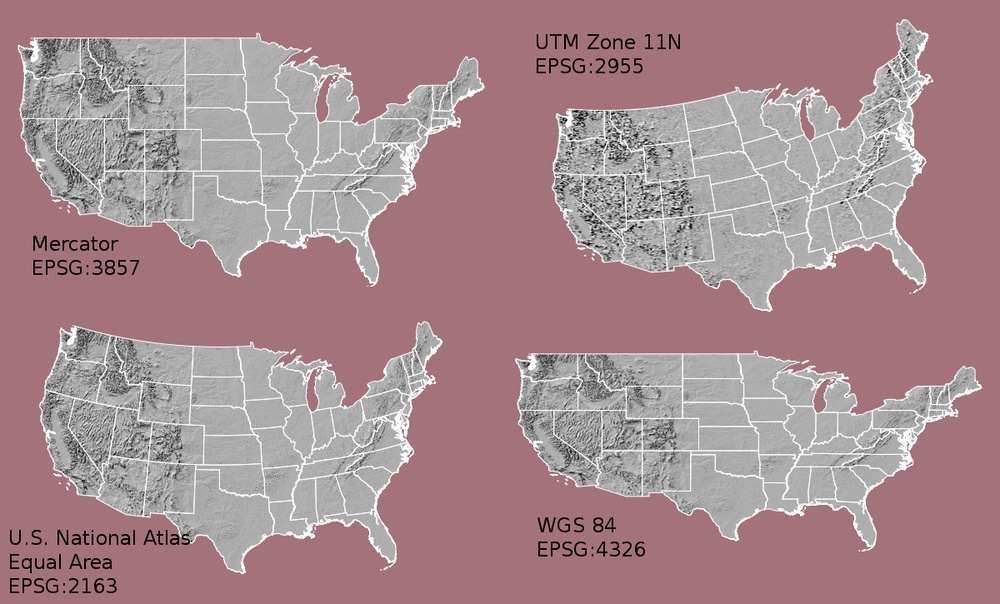

### 2. Resolution

The spatial distance that a single pixel covers on the ground.

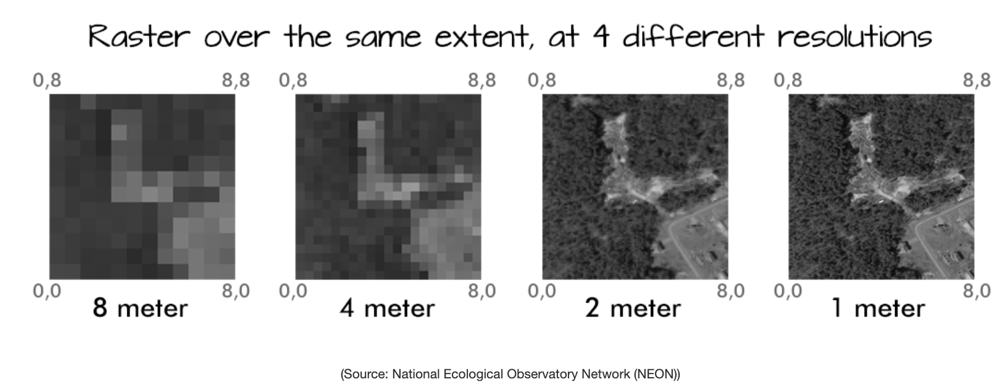

### 3. Extent

The bounding box that covers the entire extent of the raster data.

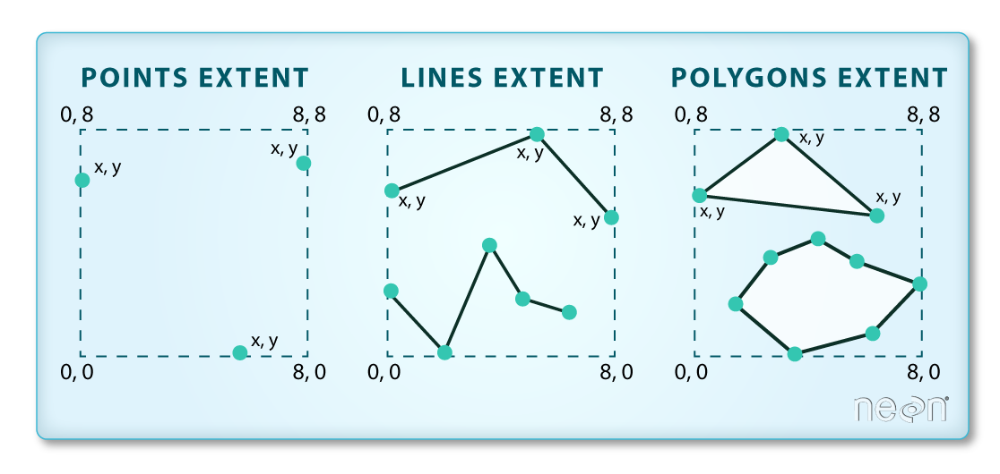</img>

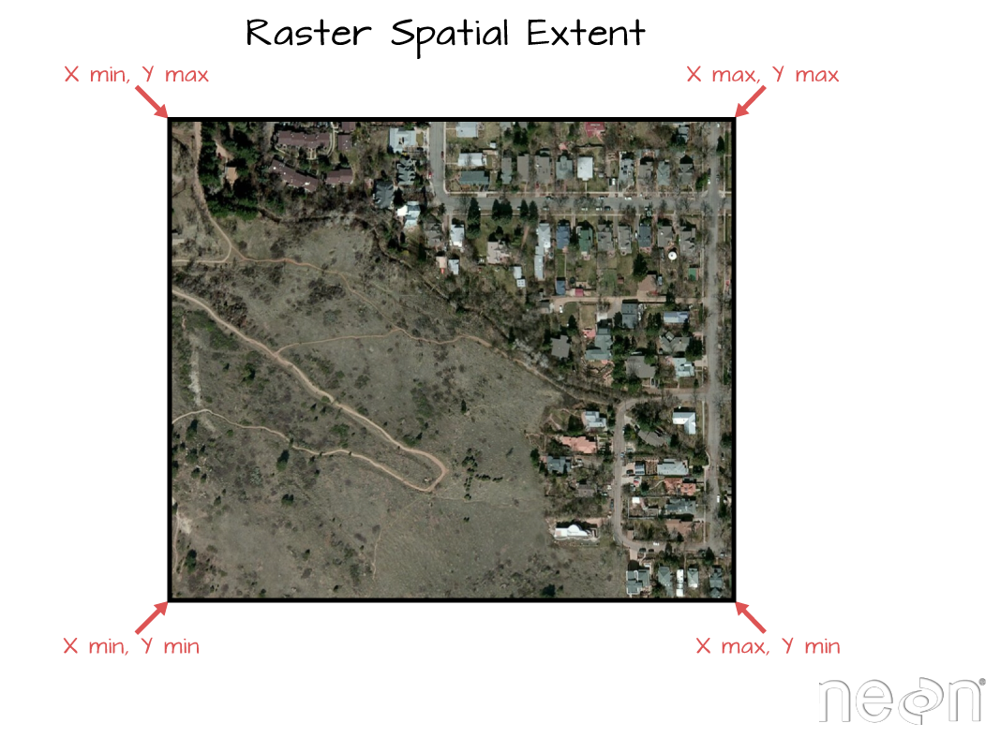</img>

### 4. Affine transformation

Pixel space --> real space

- A mapping from pixel space (rows and columns of the image) to the x and y coordinates defined by the CRS
- Typically a six parameter matrix defining the origin, pixel resolution, and rotation of the raster image

## Multi-band raster data

Each band measures the light reflected from different parts of the electromagnetic spectrum. 

<img src=attachment:Screen%20Shot%202019-09-19%20at%202.23.35%20AM.png width=800></img>
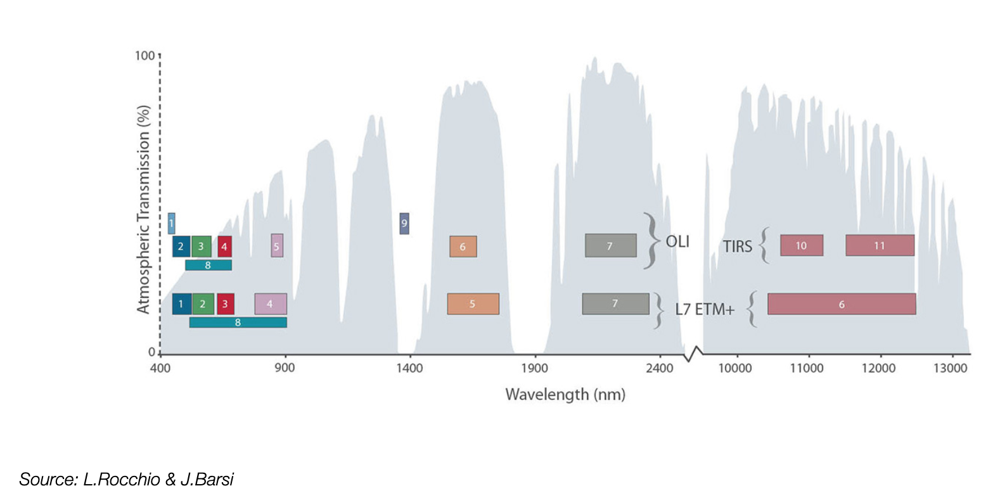

## Color images are multi-band rasters!

<img src=attachment:Screen%20Shot%202019-09-19%20at%202.25.43%20AM.png width=800></img>
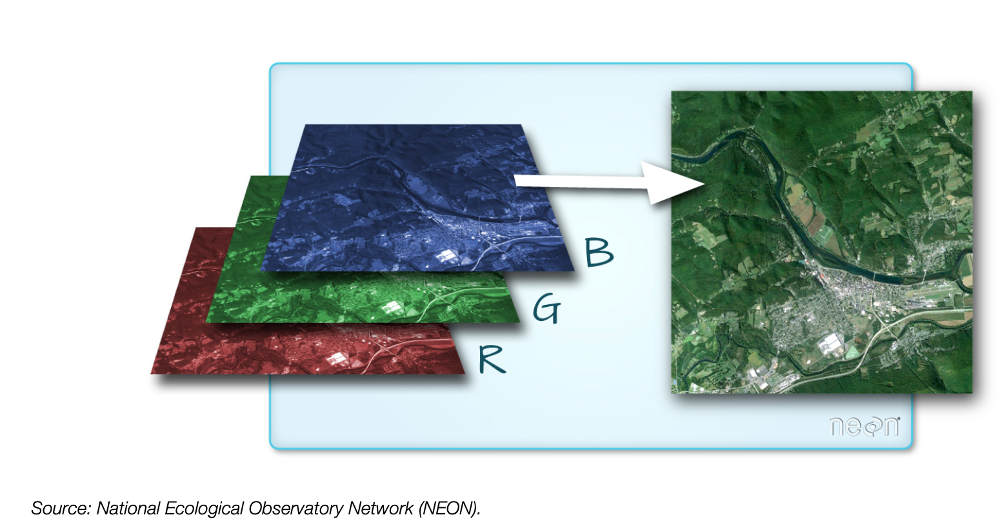

## The raster format: GeoTIFF

- A standard `.tif` image format with additional spatial information embedded in the file, which includes metadata for: 
    - Geotransform, e.g., extent, resolution
    - Coordinate Reference System (CRS)
    - Values that represent missing data (`NoDataValue`)

## Tools for raster data 

- Lots of different options: really just working with arrays
- One of the first options: Geospatial Data Abstraction Library (GDAL)
    - Low level and not really user-friendly
- A more recent, much more Pythonic package: `rasterio`

We'll use `rasterio` for the majority of our raster analysis

## Getting started with rasterio

Analysis is built around the "open()" command which returns a "dataset" or "file handle"

In [39]:
import rasterio as rio

In [40]:
# Open the file and get a file "handle"
landsat = rio.open("./data/landsat8_philly.tif")
landsat

<open DatasetReader name='./data/landsat8_philly.tif' mode='r'>

## Let's check out the metadata


In [41]:
# The CRS
landsat.crs

CRS.from_epsg(32618)

In [42]:
# The bounds
landsat.bounds

BoundingBox(left=476064.3596176505, bottom=4413096.927074196, right=503754.3596176505, top=4443066.927074196)

In [43]:
# The number of bands available
landsat.count

10

In [44]:
# The band numbers that are available, not from 0
landsat.indexes

(1, 2, 3, 4, 5, 6, 7, 8, 9, 10)

In [45]:
# Number of pixels in the x and y directions
# nrows,ncols
landsat.shape

(999, 923)

In [46]:
# The 6 parameters that map from pixel to real space
landsat.transform

Affine(30.0, 0.0, 476064.3596176505,
       0.0, -30.0, 4443066.927074196)

In [47]:
# All of the meta data
landsat.meta

{'driver': 'GTiff',
 'dtype': 'uint16',
 'nodata': None,
 'width': 923,
 'height': 999,
 'count': 10,
 'crs': CRS.from_epsg(32618),
 'transform': Affine(30.0, 0.0, 476064.3596176505,
        0.0, -30.0, 4443066.927074196)}

## Reading data from a file

Tell the file which band to read, **starting with 1**

In [48]:
# This is just a numpy array
data = landsat.read(1)
data

array([[10901, 10618, 10751, ..., 12145, 11540, 14954],
       [11602, 10718, 10546, ..., 11872, 11982, 12888],
       [10975, 10384, 10357, ..., 11544, 12318, 12456],
       ...,
       [12281, 12117, 12072, ..., 11412, 11724, 11088],
       [12747, 11866, 11587, ..., 11558, 12028, 10605],
       [11791, 11677, 10656, ..., 10615, 11557, 11137]], dtype=uint16)

We can plot it with matplotlib's `imshow`

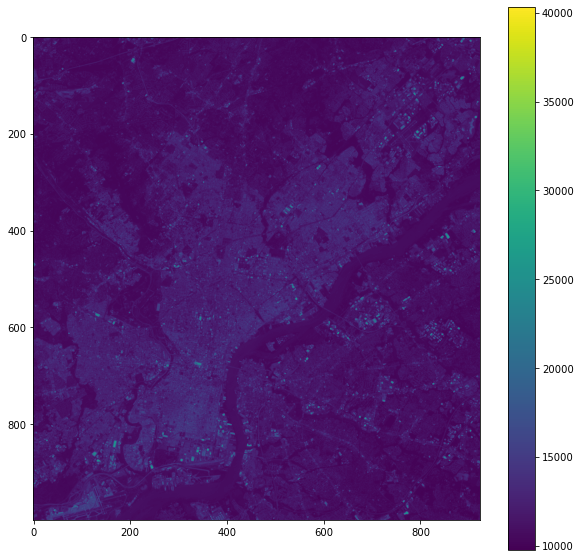

In [49]:
fig, ax = plt.subplots(figsize=(10,10))

img = ax.imshow(data)

plt.colorbar(img)

## Two improvements

- A log-scale colorbar
- Add the axes extent

## Adding the axes extent

Note that imshow needs a bounding box of the form: `(left, right, bottom, top).` 


See the documentation for `imshow` if you forget the right ordering...(I often do!)

## Using a log-scale color bar

Matplotlib has a built in log normalization...

In [50]:
import matplotlib.colors as mcolors

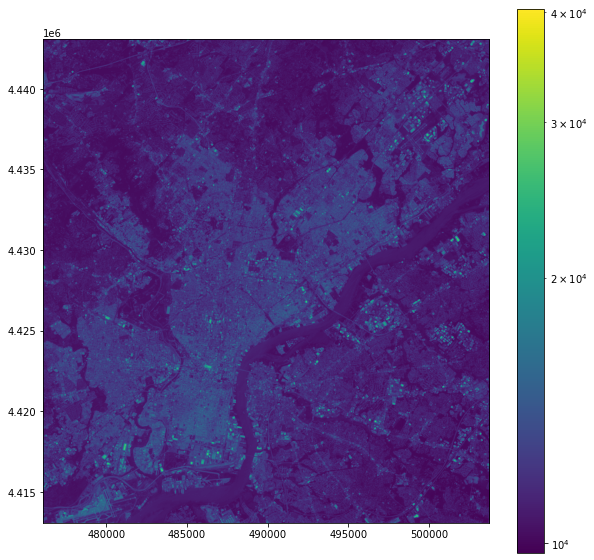

In [51]:
# Initialize
fig, ax = plt.subplots(figsize=(10, 10))

# Plot the image
img = ax.imshow(
    data,
    norm=mcolors.LogNorm(),  # Use a log colorbar scale
    extent=[  # Set the extent of the images
        landsat.bounds.left,
        landsat.bounds.right,
        landsat.bounds.bottom,
        landsat.bounds.top,
    ],
)

# Add a colorbar
plt.colorbar(img)

## Overlaying vector geometries on raster plots

Two requirements:

1. The CRS of the two datasets must match
1. The extent of the imshow plot must be set properly

## Let's add the city limits

In [52]:
city_limits = gpd.read_file("./data/City_Limits.geojson")

In [53]:
# Convert to the correct CRS!
print(landsat.crs.data)

{'init': 'epsg:32618'}


In [54]:
city_limits = city_limits.to_crs(landsat.crs.data['init'])

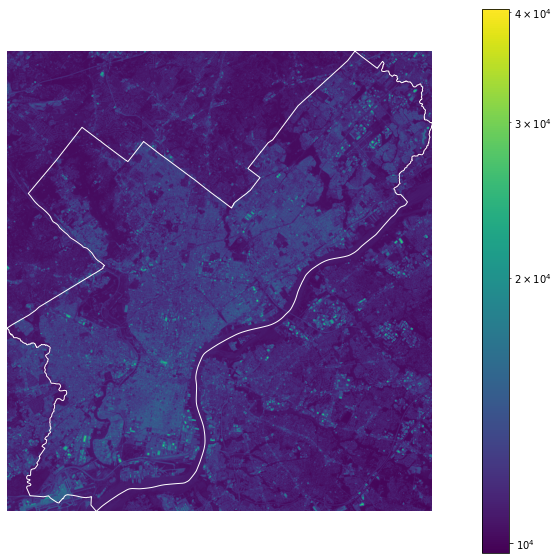

In [55]:
# Initialize
fig, ax = plt.subplots(figsize=(10, 10))

# The extent of the data
landsat_extent = [
    landsat.bounds.left,
    landsat.bounds.right,
    landsat.bounds.bottom,
    landsat.bounds.top,
]

# Plot!
img = ax.imshow(data, 
                norm=mcolors.LogNorm(), 
                extent=landsat_extent)

# Add the city limits
city_limits.plot(ax=ax, facecolor="none", edgecolor="white")

# Add a colorbar and turn off axis lines
plt.colorbar(img)
ax.set_axis_off()

## What band did we plot??

Landsat 8 has 11 bands spanning the electromagnetic spectrum from visible to infrared. 

<img src=attachment:Screen%20Shot%202019-09-19%20at%203.04.07%20AM.png width=700></img>
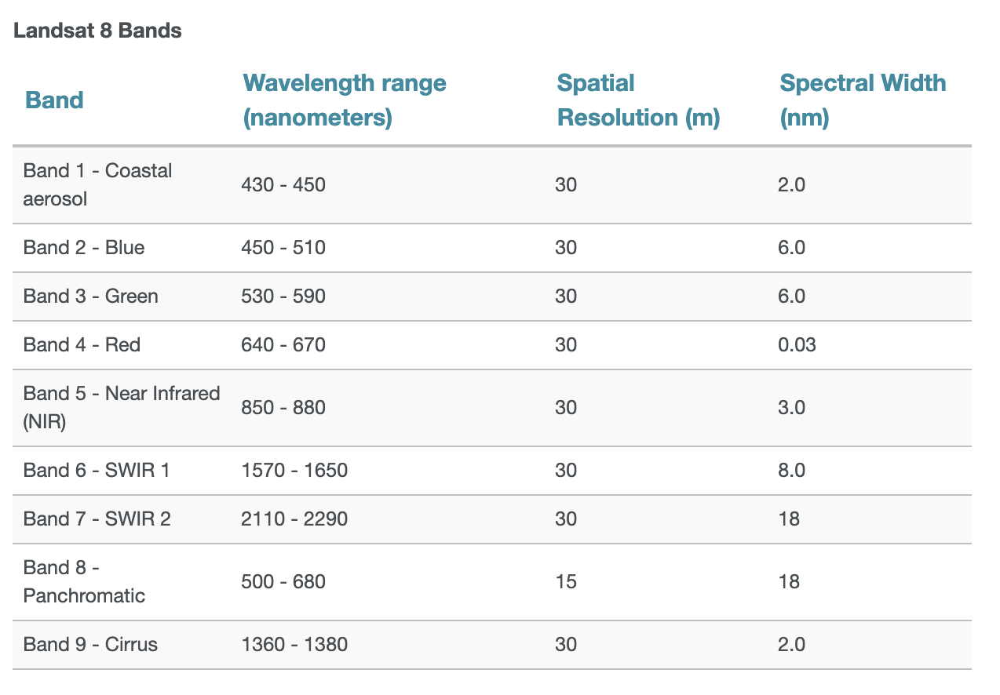

## How about a typical RGB color image?

First let's read the red, blue, and green bands (bands 4, 3, 2):

### Note

The `.indexes` attributes tells us the bands available to be read.

**Important:** they are not zero-indexed! 

In [56]:
landsat.indexes

(1, 2, 3, 4, 5, 6, 7, 8, 9, 10)

In [57]:
rgb_data = landsat.read([4, 3, 2])

In [58]:
rgb_data.shape 

(3, 999, 923)

Note the data has the shape: (bands, weight, width)

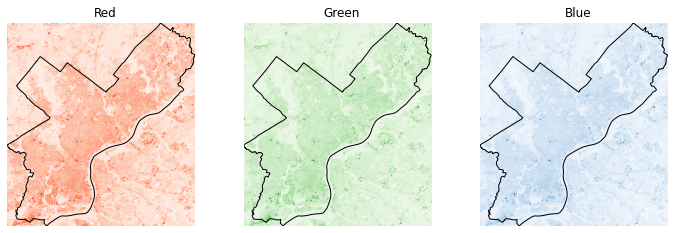

In [59]:
fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(12, 6))

cmaps = ["Reds", "Greens", "Blues"]
for i in [0, 1, 2]:

    # This subplot axes
    ax = axs[i]

    # Plot
    ax.imshow(rgb_data[i], norm=mcolors.LogNorm(), extent=landsat_extent, cmap=cmaps[i])
    city_limits.plot(ax=ax, facecolor="none", edgecolor="black")

    # Format
    ax.set_axis_off()
    ax.set_title(cmaps[i][:-1])

## Side note: using subplots in matplotlib

You can specify the subplot layout via the `nrows` and `ncols` keywords to `plt.subplots`. If you have more than one row or column, the function returns: 
- The figure
- The **list of axes**.

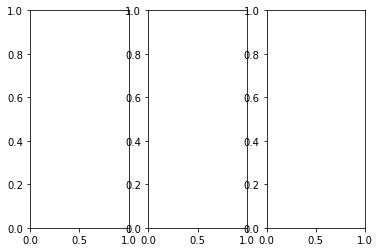

In [64]:
fig, axs = plt.subplots(nrows=1, ncols=3)

### Note

When nrows or ncols > 1, I usually name the returned axes variable "axs" vs. the usual case of just "ax". It's useful for remembering we got more than one Axes object back!

In [31]:
# This has length 3 for each of the 3 columns!
axs

array([<AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>], dtype=object)

In [32]:
# Left axes
axs[0]  

<AxesSubplot:>

In [33]:
# Middle axes
axs[1]

<AxesSubplot:>

In [34]:
# Right axes
axs[2]

<AxesSubplot:>

## Use `earthpy` to plot the combined color image

A useful utility package to perform the proper re-scaling of pixel values

In [66]:
import earthpy.plot as ep

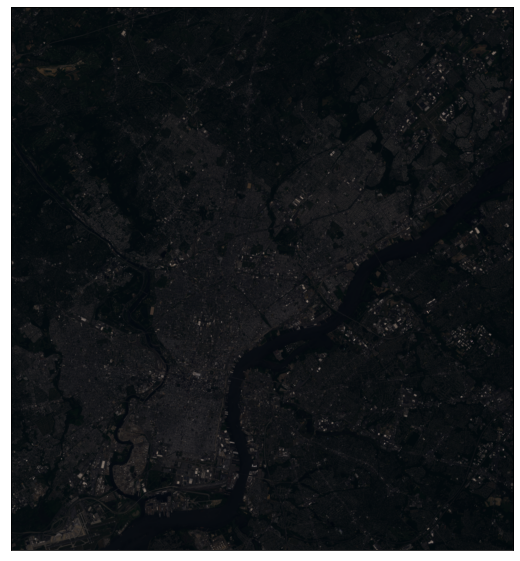

In [67]:
# Initialize
fig, ax = plt.subplots(figsize=(10,10))

# Plot the RGB bands
ep.plot_rgb(rgb_data, rgb=(0, 1, 2), ax=ax);

## We can "stretch" the data to improve the brightness

<img src=attachment:Screen%20Shot%202019-09-19%20at%203.05.42%20AM.png width=700></img>
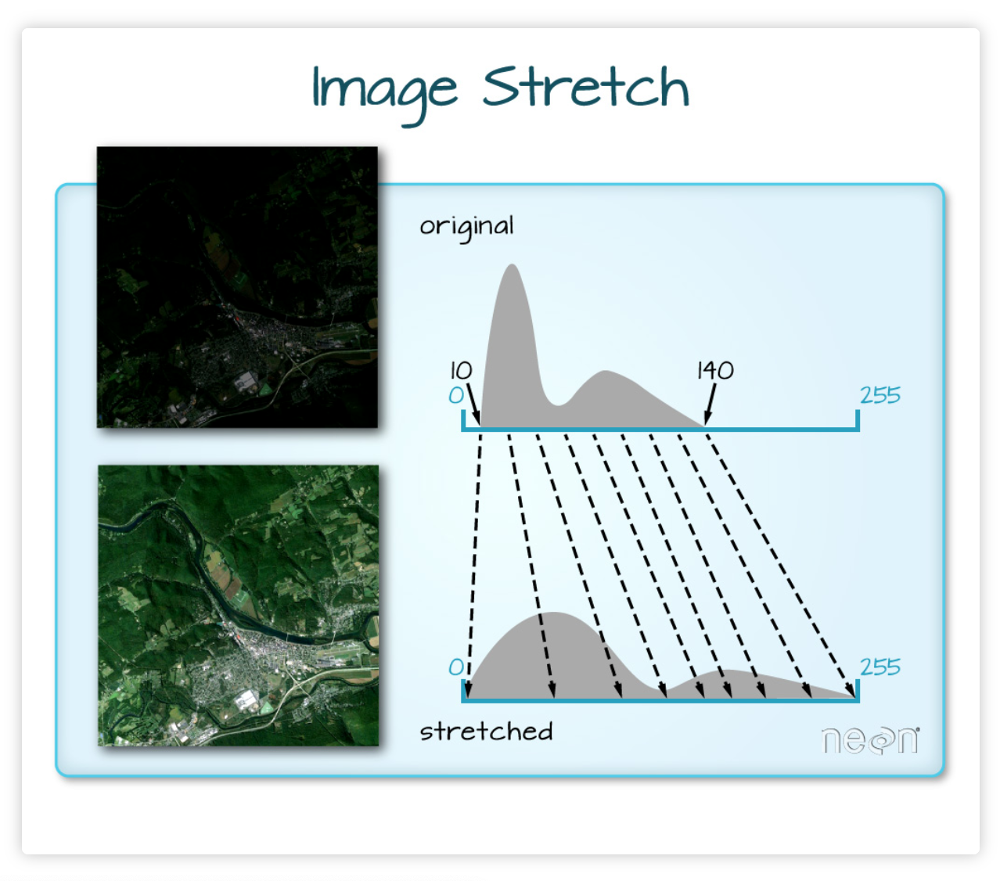

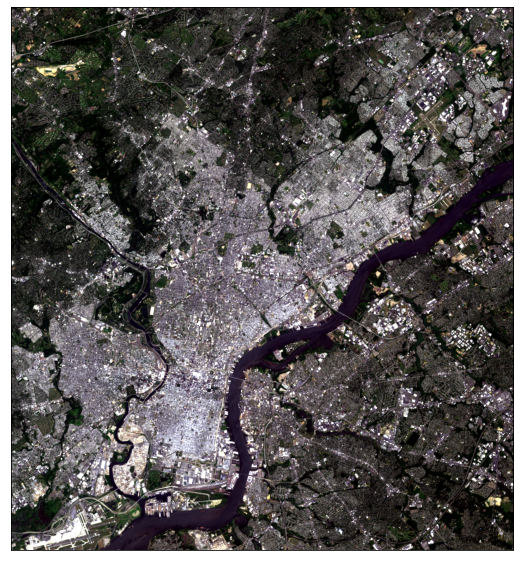

In [68]:
# Initialize
fig, ax = plt.subplots(figsize=(10,10))

# Plot the RGB bands
ep.plot_rgb(rgb_data, rgb=(0, 1, 2), ax=ax, stretch=True);

## Conclusion: Working with multi-band data is a bit messy

Can we do better?

## Yes! HoloViz to the rescue...

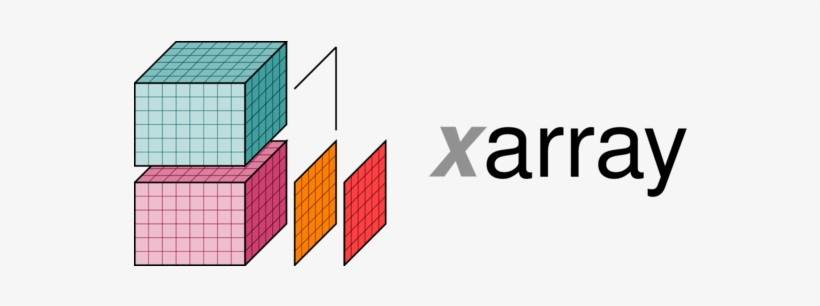</img>

## xarray

- A fancier version of numpy arrays
- Designed for gridded data with multiple dimensions
- For raster data, those dimensions are: bands, latitude, longitude, pixel values

## Let's try it out...

In [73]:
import xarray as xr

In [74]:
xr.open_rasterio?

In [75]:
ds = xr.open_rasterio("./data/landsat8_philly.tif")
ds

<xarray.DataArray (band: 10, y: 999, x: 923)>
[9220770 values with dtype=uint16]
Coordinates:
  * band     (band) int32 1 2 3 4 5 6 7 8 9 10
  * y        (y) float64 4.443e+06 4.443e+06 4.443e+06 ... 4.413e+06 4.413e+06
  * x        (x) float64 4.761e+05 4.761e+05 4.761e+05 ... 5.037e+05 5.037e+05
Attributes:
    transform:      (30.0, 0.0, 476064.3596176505, 0.0, -30.0, 4443066.927074...
    crs:            +init=epsg:32618
    res:            (30.0, 30.0)
    is_tiled:       0
    nodatavals:     (nan, nan, nan, nan, nan, nan, nan, nan, nan, nan)
    scales:         (1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0)
    offsets:        (0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0)
    AREA_OR_POINT:  Area

In [76]:
type(ds)

xarray.core.dataarray.DataArray

## Now the magic begins: more hvplot

Still experimental, but very promising — interactive plots with widgets for each band!

In [77]:
import hvplot.xarray

In [78]:
img = ds.hvplot.image(width=700, height=500, cmap='viridis')
img

:DynamicMap   [band]
   :Image   [x,y]   (value)

## More magic widgets!

## Two key raster concepts

- Using vector + raster data
    - Cropping or masking raster data based on vector polygons
- Raster math and zonal statistics
    - Combining multiple raster data sets
    - Calculating statistics within certain vector polygons

## Cropping: let's trim to just the city limits

Use rasterio's builtin mask function:

In [79]:
from rasterio.mask import mask

In [80]:
masked, mask_transform = mask(
    dataset=landsat,
    shapes=city_limits.geometry,
    crop=True,  # remove pixels not within boundary
    all_touched=True,  # get all pixels that touch the boudnary
    filled=False,  # do not fill cropped pixels with a default value
)

In [47]:
masked.shape

(10, 999, 923)

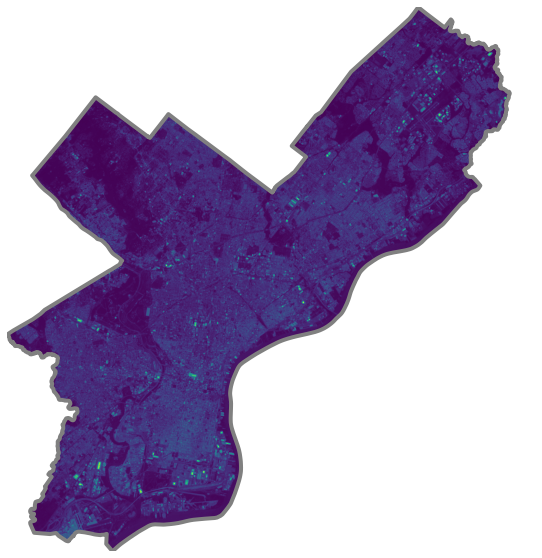

In [82]:
# Initialize
fig, ax = plt.subplots(figsize=(10, 10))

# Plot the first band
ax.imshow(masked[0], cmap="viridis", extent=landsat_extent)

# Format and add the city limits
city_limits.boundary.plot(ax=ax, color="gray", linewidth=4)
ax.set_axis_off()

## Writing GeoTIFF files

Let's save our cropped raster data. To save raster data, we need both the array of the data and the proper meta-data. 

In [50]:
out_meta = landsat.meta
out_meta.update(
    {"height": masked.shape[1], "width": masked.shape[2], "transform": mask_transform}
)
print(out_meta)

# write small image to local Geotiff file
with rio.open("data/cropped_landsat.tif", "w", **out_meta) as dst:
    dst.write(masked)

{'driver': 'GTiff', 'dtype': 'uint16', 'nodata': None, 'width': 923, 'height': 999, 'count': 10, 'crs': CRS.from_epsg(32618), 'transform': Affine(30.0, 0.0, 476064.3596176505,
       0.0, -30.0, 4443066.927074196)}


In [51]:
landsat

<open DatasetReader name='./data/landsat8_philly.tif' mode='r'>

Note: we used a *context manager* above (the "with" statement) to handle the opening and subsequent closing of our new file.

For more info, see [this tutorial](https://www.pythontutorial.net/advanced-python/python-context-managers/).

## Now let's do some raster math

Often called "map algebra"...

## The Normalized Difference Vegetation Index

- A normalized index of greenness ranging from -1 to 1, calculated from the red and NIR bands. 
- Provides a measure of the amount of live green vegetation in an area

**Formula:**

NDVI = (NIR - Red) / (NIR + Red)

Healthy vegetation reflects NIR and absorbs visible, so the NDVI for green vegatation

## Get the data for the red and NIR bands

NIR is band 5 and red is band 4

In [83]:
masked.shape

(10, 999, 923)

In [84]:
# Note that the indexing here is zero-based, e.g., band 1 is index 0
red = masked[3]
nir = masked[4]

In [86]:
def calculate_NDVI(nir, red):
    """
    Calculate the NDVI from the NIR and red landsat bands
    """
    
    # Convert to floats
    nir = nir.astype(float)
    red = red.astype(float)
    
    # Get valid entries
    check = np.logical_and( red.mask == False, nir.mask == False )
    
    # Where the check is True, return the NDVI, else return NaN
    ndvi = np.where(check,  (nir - red ) / ( nir + red ), np.nan )
    return ndvi 


In [87]:
NDVI = calculate_NDVI(nir, red)

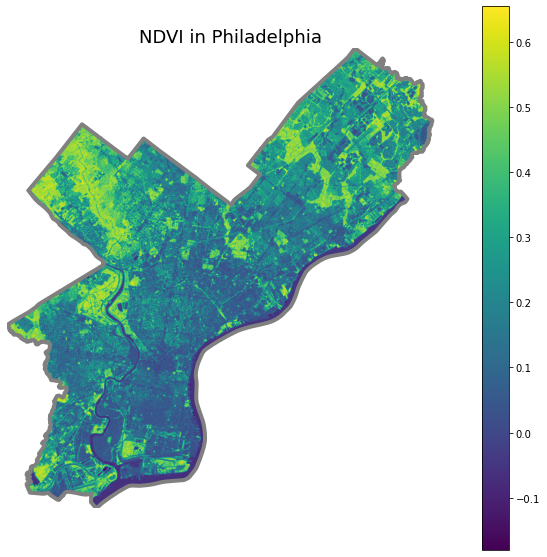

In [88]:
fig, ax = plt.subplots(figsize=(10,10))

# Plot NDVI
img = ax.imshow(NDVI, extent=landsat_extent)

# Format and plot city limits
city_limits.plot(ax=ax, edgecolor='gray', facecolor='none', linewidth=4)
plt.colorbar(img)
ax.set_axis_off()
ax.set_title("NDVI in Philadelphia", fontsize=18);

## Let's overlay Philly's parks

In [89]:
# Read in the parks dataset
parks = gpd.read_file('./data/parks.geojson')

In [90]:
# Print out the CRS
parks.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [91]:
# Conver to landsat CRS
parks = parks.to_crs(landsat.crs.data['init'])

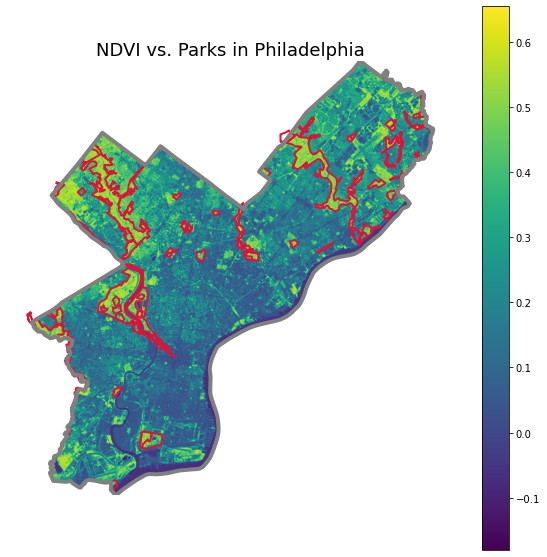

In [92]:
fig, ax = plt.subplots(figsize=(10,10))

# Plot NDVI
img = ax.imshow(NDVI, extent=landsat_extent)

# NEW: add the parks
parks.plot(ax=ax, edgecolor='crimson', facecolor='none', linewidth=2)

# Format and plot city limits
city_limits.plot(ax=ax, edgecolor='gray', facecolor='none', linewidth=4)
plt.colorbar(img)
ax.set_axis_off()
ax.set_title("NDVI vs. Parks in Philadelphia", fontsize=18);

It looks like it worked pretty well!

## How about calculating the median NDVI within the park geometries?

This is called *zonal statistics*. We can use the `rasterstats` package to do this...

In [93]:
from rasterstats import zonal_stats

In [94]:
stats = zonal_stats(parks, NDVI, affine=landsat.transform, stats=['mean', 'median'])

C:\Users\WIN10\miniconda3\envs\musa-550-fall-2021\lib\site-packages\rasterstats\io.py:302: UserWarning: Setting nodata to -999; specify nodata explicitly
  warnings.warn("Setting nodata to -999; specify nodata explicitly")


## The `zonal_stats` function

Zonal statistics of raster values aggregated to vector geometries.

- First argument: vector data
- Second argument: raster data to aggregated
- Also need to pass the affine transform and the names of the stats to compute

In [95]:
stats

[{'mean': 0.5051087300747117, 'median': 0.521160491292894},
 {'mean': 0.441677258928841, 'median': 0.47791901454593105},
 {'mean': 0.4885958179164529, 'median': 0.5084981442485412},
 {'mean': 0.3756264171005127, 'median': 0.42356277391080177},
 {'mean': 0.45897667566035816, 'median': 0.49204860985900256},
 {'mean': 0.4220467885671325, 'median': 0.46829433706341134},
 {'mean': 0.38363107808041097, 'median': 0.416380868090128},
 {'mean': 0.4330996771737791, 'median': 0.4772304906066629},
 {'mean': 0.45350534061220404, 'median': 0.5015001304461257},
 {'mean': 0.44505112880627273, 'median': 0.4701653486700216},
 {'mean': 0.5017048095513129, 'median': 0.5108644957689836},
 {'mean': 0.23745576631277313, 'median': 0.24259729272419628},
 {'mean': 0.31577818701756977, 'median': 0.3306512446567765},
 {'mean': 0.5300954792288528, 'median': 0.5286783042394015},
 {'mean': 0.4138823685577781, 'median': 0.4604562737642586},
 {'mean': 0.48518030764354636, 'median': 0.5319950233699855},
 {'mean': 0.315

In [96]:
len(parks)

63

In [97]:
# Store the median value in the parks data frame
parks['median_NDVI'] = [s['median'] for s in stats] 

In [98]:
parks.head()

,OBJECTID,ASSET_NAME,SITE_NAME,CHILD_OF,ADDRESS,TYPE,USE_,DESCRIPTION,SQ_FEET,ACREAGE,ZIPCODE,ALLIAS,NOTES,TENANT,LABEL,DPP_ASSET_ID,Shape__Area,Shape__Length,geometry,median_NDVI
0,7,Wissahickon Valley Park,Wissahickon Valley Park,Wissahickon Valley Park,None,LAND,REGIONAL_CONSERVATION_WATERSHED,NO_PROGRAM,9.078309e+07,2084.101326,19128,,MAP,SITE,Wissahickon Valley Park,1357,1.441162e+07,71462.556702,"MULTIPOLYGON (((484101.476 4431051.989, 484099...",0.521160
1,8,West Fairmount Park,West Fairmount Park,West Fairmount Park,,LAND,REGIONAL_CONSERVATION_WATERSHED,NO_PROGRAM,6.078159e+07,1395.358890,19131,,MAP,SITE,West Fairmount Park,1714,9.631203e+06,25967.819064,"MULTIPOLYGON (((482736.681 4428824.579, 482728...",0.477919
2,23,Pennypack Park,Pennypack Park,Pennypack Park,,LAND,REGIONAL_CONSERVATION_WATERSHED,NO_PROGRAM,6.023748e+07,1382.867808,19152,Verree Rd Interpretive Center,MAP,SITE,Pennypack Park,1651,9.566914e+06,41487.394790,"MULTIPOLYGON (((497133.192 4434667.950, 497123...",0.508498
3,24,East Fairmount Park,East Fairmount Park,East Fairmount Park,,LAND,REGIONAL_CONSERVATION_WATERSHED,NO_PROGRAM,2.871642e+07,659.240959,19121,,MAP,SITE,East Fairmount Park,1713,4.549582e+06,21499.126097,"POLYGON ((484539.743 4424162.545, 484620.184 4...",0.423563
4,25,Tacony Creek Park,Tacony Creek Park,Tacony Creek Park,,LAND,REGIONAL_CONSERVATION_WATERSHED,NO_PROGRAM,1.388049e+07,318.653500,19120,,MAP,SITE,Tacony Creek Park,1961,2.201840e+06,19978.610852,"MULTIPOLYGON (((491712.882 4429633.244, 491713...",0.492049


## Make a quick histogram of the median values

They are all positive, indicating an abundance of green vegetation...

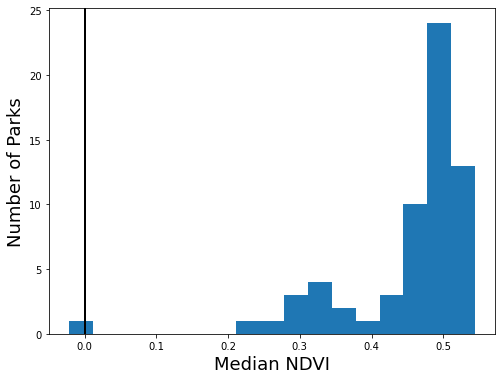

In [99]:
# Initialize
fig, ax = plt.subplots(figsize=(8,6))

# Plot a quick histogram 
ax.hist(parks['median_NDVI'], bins='auto')
ax.axvline(x=0, c='k', lw=2)

# Format
ax.set_xlabel("Median NDVI", fontsize=18)
ax.set_ylabel("Number of Parks", fontsize=18);

## Let's make a choropleth, too

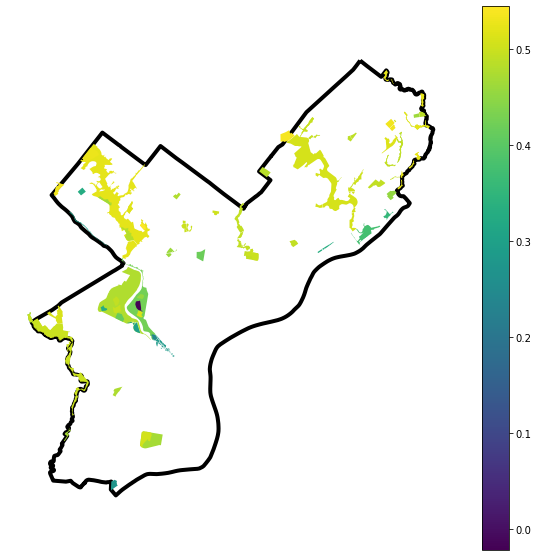

In [100]:
# Initialize
fig, ax = plt.subplots(figsize=(10,10))

# Plot the city limits
city_limits.plot(ax=ax, edgecolor='black', facecolor='none', linewidth=4)

# Plot the median NDVI
parks.plot(column='median_NDVI', legend=True, ax=ax, cmap='viridis')

# Format
ax.set_axis_off()

## Let's make it interactive!

*Make sure to check the crs!*

In [101]:
parks.crs

<Projected CRS: EPSG:32618>
Name: WGS 84 / UTM zone 18N
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: Between 78°W and 72°W, northern hemisphere between equator and 84°N, onshore and offshore. Bahamas. Canada - Nunavut; Ontario; Quebec. Colombia. Cuba. Ecuador. Greenland. Haiti. Jamica. Panama. Turks and Caicos Islands. United States (USA). Venezuela.
- bounds: (-78.0, 0.0, -72.0, 84.0)
Coordinate Operation:
- name: UTM zone 18N
- method: Transverse Mercator
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

The CRS is "EPSG:32618" and since it's not in 4326, we'll need to specify the "crs=" keyword when plotting!

In [102]:
# trim to only the columns we want to plot
cols = ["median_NDVI", "SITE_NAME", "geometry"]

# Plot the parks colored by median NDVI
p = parks[cols].hvplot.polygons(c="median_NDVI", 
                                geo=True, 
                                crs=32618, 
                                cmap='viridis', 
                                hover_cols=["SITE_NAME"])

# Plot the city limit boundary
cl = city_limits.hvplot.polygons(
    geo=True,
    crs=32618,
    alpha=0,
    line_alpha=1,
    line_color="black",
    hover=False,
    width=700,
    height=600,
)

# combine!
cl * p

:Overlay
   .Polygons.I  :Polygons   [Longitude,Latitude]
   .Polygons.II :Polygons   [Longitude,Latitude]   (median_NDVI,SITE_NAME)

## Exercise: Measure the median NDVI for each of Philadelphia's neighborhoods

- A GeoJSON file of Philly's neighborhoods is available in the "data/" folder
- Once you measure the median value for each neighborhood, make the following charts:
    - A histogram of the median values for all neighborhoods
    - Bar graphs with the neighborhoods with the 20 highest and 20 lowest values
    - A choropleth showing the median values across the city
    
You're welcome to use matplotlib/geopandas, but encouraged to explore the new hvplot options!

## Make a histogram of median values

## Plot a (static) choropleth map

## Plot an (interactive) choropleth map

## Plot a bar chart of the neighborhoods with the top 20 largest median values

## Plot a bar chart of the neighborhoods with the bottom 20 largest median values

## That's it!

- Next week: introduction to APIs and downloading data from the web in Python
- See you on Monday!